In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from itertools import product
from dateutil.relativedelta import relativedelta

import scipy.stats as scs
from scipy import stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.tsa.api as smt
from scipy.optimize import minimize

from sklearn.metrics import mean_absolute_error, mean_squared_error

from tqdm.notebook import tqdm
from tqdm import tqdm_notebook

from sklearn.model_selection import train_test_split # разбиение данных на тренировочные и тестовые


from sklearn.preprocessing import StandardScaler # нормализация и масштабирование данных

from sklearn.model_selection import TimeSeriesSplit

from sklearn.model_selection import cross_val_score # кроссвалидация
from sklearn.model_selection import GridSearchCV # подбор гиперпараметров с кроссвалидацией

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV, RidgeCV
from xgboost import XGBRegressor

import statsmodels


import gc
import glob
import os
from scipy import stats
import plotly.express as px
import plotly.graph_objects as go
from numpy import percentile

# sns.set()
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf

from tensorflow.keras.layers import Input, Dense, BatchNormalization, Activation, Dropout
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import regularizers
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_samples
from tqdm import tqdm
from tensorflow.keras.models import load_model

from itertools import product

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
all_files_cpu = glob.glob(os.path.join("/content/drive/MyDrive/Colab Notebooks/k8s/cpu/*.csv"))
all_files_cpu.sort()

li = []

for filename in all_files_cpu:
    print(filename)
    df = pd.read_csv(filename, skiprows=[0], parse_dates=['Time'])
    li.append(df)


cpu = pd.concat(li, axis=0, ignore_index=True)

fields_nodes_all = ['real: cl1i6ek5us1gmcv87dql-oqaz |  ', 'real: cl1i6ek5us1gmcv87dql-ulyg |  ', 'real: cl1i6ek5us1gmcv87dql-utuc |  ']
fields_nodes_first = ['Time', 'real: cl1i6ek5us1gmcv87dql-oqaz |  ']

cpu.columns = ['Time', 'node1', 'node2', 'node3']
cpu['nodes_all'] = cpu['node1'] + cpu['node2'] + cpu['node3']


/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU10-15__10-20.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU10-21__10-24.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU10-25__10-27.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU10-27__11-03.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU11-03__11-08.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU11-08__11-11.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU11-12__11-14.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU11-14__11-18.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU11-19__11-22.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU2023-11-22__2023-11-26.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU2023-11-27__2023-12-02.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU2023-12-02__2023-12-09.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU2023-12-10__2023-12-16.csv
/content/drive/MyDrive/Colab Notebooks/k8s/cpu/CPU2023-12-17-2023-12-22.csv
/content/driv

In [ ]:
cpu

,Time,node1,node2,node3,nodes_all
0,2023-10-15 19:10:00,0.7230,0.174,0.490,1.3870
1,2023-10-15 19:15:00,1.6500,0.953,0.492,3.0950
2,2023-10-15 19:20:00,1.3900,0.824,0.378,2.5920
3,2023-10-15 19:25:00,1.4000,0.734,0.473,2.6070
4,2023-10-15 19:30:00,1.4900,0.879,0.528,2.8970
...,...,...,...,...,...
31031,2024-02-04 23:35:00,0.0799,0.218,0.186,0.4839
31032,2024-02-04 23:40:00,0.0799,0.218,0.188,0.4859
31033,2024-02-04 23:45:00,0.0801,0.215,0.188,0.4831
31034,2024-02-04 23:50:00,0.0805,0.217,0.187,0.4845


In [ ]:
df_cpu = cpu[['Time', 'node1']]
df_cpu.columns = ['time', 'cpu_usage']
df_cpu.set_index('time', inplace=True)

#df_cpu = df_cpu.resample('1H', base=0.5).last()


print(df_cpu.isnull().any())
print(df_cpu.isna().any())
df_cpu['cpu_usage'].fillna(df_cpu['cpu_usage'].mean(), inplace=True)
print(df_cpu.isnull().any())
print(df_cpu.isna().any())

cpu_usage    False
dtype: bool
cpu_usage    False
dtype: bool
cpu_usage    False
dtype: bool
cpu_usage    False
dtype: bool


In [ ]:
df_cpu

,cpu_usage
time,
2023-10-15 19:10:00,0.7230
2023-10-15 19:15:00,1.6500
2023-10-15 19:20:00,1.3900
2023-10-15 19:25:00,1.4000
2023-10-15 19:30:00,1.4900
...,...
2024-02-04 23:35:00,0.0799
2024-02-04 23:40:00,0.0799
2024-02-04 23:45:00,0.0801


In [ ]:
all_files_ram = glob.glob(os.path.join("/content/drive/MyDrive/Colab Notebooks/k8s/ram/*.csv"))
all_files_ram.sort()

li = []

for filename in all_files_ram:
    df = pd.read_csv(filename, skiprows=[0], parse_dates=['Time'])
    li.append(df)


ram = pd.concat(li, axis=0, ignore_index=True)

fields_nodes_all = ['real: cl1i6ek5us1gmcv87dql-oqaz |  ', 'real: cl1i6ek5us1gmcv87dql-ulyg |  ', 'real: cl1i6ek5us1gmcv87dql-utuc |  ']
fields_nodes_first = ['Time', 'real: cl1i6ek5us1gmcv87dql-oqaz |  ']

ram.columns = ['Time', 'node1', 'node2', 'node3']
ram['nodes_all'] = ram['node1'] + ram['node2'] + ram['node3']

In [ ]:
ram

,Time,node1,node2,node3,nodes_all
0,2023-10-15 19:10:00,37038891008,36398960640,38560374784,111998226432
1,2023-10-15 19:15:00,37153251328,36420562944,39022686208,112596500480
2,2023-10-15 19:20:00,37240102912,36420161536,39149137920,112809402368
3,2023-10-15 19:25:00,37333958656,36423467008,39163170816,112920596480
4,2023-10-15 19:30:00,37343805440,36425986048,40512155648,114281947136
...,...,...,...,...,...
31031,2024-02-04 23:35:00,59966435328,50358718464,52388679680,162713833472
31032,2024-02-04 23:40:00,60111867904,50365763584,52309880832,162787512320
31033,2024-02-04 23:45:00,60007501824,50336706560,52273143808,162617352192
31034,2024-02-04 23:50:00,59999752192,50343628800,52292202496,162635583488


In [ ]:
df_ram = ram[['Time', 'node1']]
df_ram.columns = ['time', 'ram_usage']
df_ram.set_index('time', inplace=True)

#df_ram = df_ram.resample('1H', base=0.5).last()


print(df_ram.isnull().any())
print(df_ram.isna().any())
df_ram['ram_usage'].fillna(df_ram['ram_usage'].mean(), inplace=True)
print(df_ram.isnull().any())
print(df_ram.isna().any())

ram_usage    False
dtype: bool
ram_usage    False
dtype: bool
ram_usage    False
dtype: bool
ram_usage    False
dtype: bool


In [ ]:
df_ram

,ram_usage
time,
2023-10-15 19:10:00,37038891008
2023-10-15 19:15:00,37153251328
2023-10-15 19:20:00,37240102912
2023-10-15 19:25:00,37333958656
2023-10-15 19:30:00,37343805440
...,...
2024-02-04 23:35:00,59966435328
2024-02-04 23:40:00,60111867904
2024-02-04 23:45:00,60007501824


In [ ]:
df_cpu['ram_usage'] = df_ram['ram_usage']
df = df_cpu
X = df.copy()
df

,cpu_usage,ram_usage
time,,
2023-10-15 19:10:00,0.7230,37038891008
2023-10-15 19:15:00,1.6500,37153251328
2023-10-15 19:20:00,1.3900,37240102912
2023-10-15 19:25:00,1.4000,37333958656
2023-10-15 19:30:00,1.4900,37343805440
...,...,...
2024-02-04 23:35:00,0.0799,59966435328
2024-02-04 23:40:00,0.0799,60111867904
2024-02-04 23:45:00,0.0801,60007501824


In [ ]:
for column in df.columns:
    fig = px.line(df, x=df.index, y=[column], title='AWS ' + column, template = 'plotly_dark')
    fig.show()

# Autoencoder

In [ ]:
column_usage = 'ram_usage'

StSc = StandardScaler()
StSc.fit(df[[column_usage]])

df_sc = StSc.transform(df[[column_usage]])

In [ ]:
def Random(seed_value):
    import os
    os.environ['PYTHONHASHSEED'] = str(seed_value)
    import random
    random.seed(seed_value)
    import numpy as np
    np.random.seed(seed_value)
    import tensorflow as tf
    tf.random.set_seed(seed_value)

In [ ]:
# Функция для обучения конкретной архитектуры модели
def arch(param, data):
    """
    Обучение конкретной архитектуры

    Parameters
    ----------
    param : list

    data : np.array
    """
    Random(0)
    input_dots = Input((1,))

    x = Dense(param[0])(input_dots)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Dense(param[1])(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    bottleneck = Dense(param[2], activation='linear')(x)

    x = Dense(param[1])(bottleneck)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Dense(param[0])(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    out = Dense(1, activation='linear')(x)

    model = Model(input_dots, out)
    model.compile(optimizer=Adam(param[3]), loss=tf.keras.losses.MeanAbsoluteError(), metrics=[tf.keras.metrics.mean_absolute_error])

    model.fit(data, data,
                validation_split=0.2,
                epochs=param[5],
                batch_size=param[4],
                verbose=1,
                shuffle=False,
               )
    return model

In [ ]:
use_saved_model = False
model = model =  load_model('/content/my_model(1).h5') if use_saved_model else arch(param=(7, 6, 5, 0.0001, 20, 100), data=df[[column_usage]])

Epoch 1/100
1242/1242 [==============================] - 9s 5ms/step - loss: 57328832512.0000 - mean_absolute_error: 57328832512.0000 - val_loss: 49951854592.0000 - val_mean_absolute_error: 49951854592.0000
Epoch 2/100
1242/1242 [==============================] - 4s 3ms/step - loss: 57328832512.0000 - mean_absolute_error: 57328832512.0000 - val_loss: 49951854592.0000 - val_mean_absolute_error: 49951854592.0000
Epoch 3/100
1242/1242 [==============================] - 5s 4ms/step - loss: 57328832512.0000 - mean_absolute_error: 57328832512.0000 - val_loss: 49951854592.0000 - val_mean_absolute_error: 49951854592.0000
Epoch 4/100
1242/1242 [==============================] - 6s 5ms/step - loss: 57328832512.0000 - mean_absolute_error: 57328832512.0000 - val_loss: 49951854592.0000 - val_mean_absolute_error: 49951854592.0000
Epoch 5/100
1242/1242 [==============================] - 5s 4ms/step - loss: 57328832512.0000 - mean_absolute_error: 57328832512.0000 - val_loss: 49951854592.0000 - val_mea

In [ ]:
for i in range(df_sc.shape[1]):
    fig = px.line(df,
                  x=df.index,
                  y=[StSc.inverse_transform(df_sc)[:, i],
                     StSc.inverse_transform(model.predict(df_sc))[:, i]],
                  title='AWS ' + column,
                  template = 'plotly_dark')
    fig.show()

970/970 [==============================] - 2s 2ms/step


In [ ]:
mean_absolute_error(df_sc, model.predict(df_sc))

970/970 [==============================] - 2s 2ms/step


1.2349804097796206

In [ ]:
pred_residuals = df_sc - model.predict(df_sc)
UCL = pd.DataFrame(pred_residuals).abs().sum(axis=1).quantile(0.95)

fig = px.line(df,
              x=df.index,
              y=[pred_residuals[:, 0]],
              title='График разностей сигналов',
              template = 'plotly_dark')
fig.show()

970/970 [==============================] - 4s 4ms/step


In [ ]:
fig = px.line(df,
              x=df.index,
              y=[pd.DataFrame(pred_residuals, index=df.index).abs().sum(axis=1).values, np.full(shape=len(pred_residuals),fill_value=UCL,dtype=np.float64 )],
              title='График разностей сигналов',
              template = 'plotly_dark')
fig.show()

In [ ]:
dfx = df.copy()
dfx['is_outlier'] = pd.DataFrame(pred_residuals, index=df.index).abs().sum(axis=1) > UCL
dfx["outlier"] = dfx["is_outlier"].astype(int)
dfx

,cpu_usage,ram_usage,is_outlier,outlier
time,,,,
2023-10-15 19:10:00,0.7230,37038891008,False,0
2023-10-15 19:15:00,1.6500,37153251328,True,1
2023-10-15 19:20:00,1.3900,37240102912,True,1
2023-10-15 19:25:00,1.4000,37333958656,True,1
2023-10-15 19:30:00,1.4900,37343805440,True,1
...,...,...,...,...
2024-02-04 23:35:00,0.0799,59966435328,False,0
2024-02-04 23:40:00,0.0799,60111867904,False,0
2024-02-04 23:45:00,0.0801,60007501824,False,0


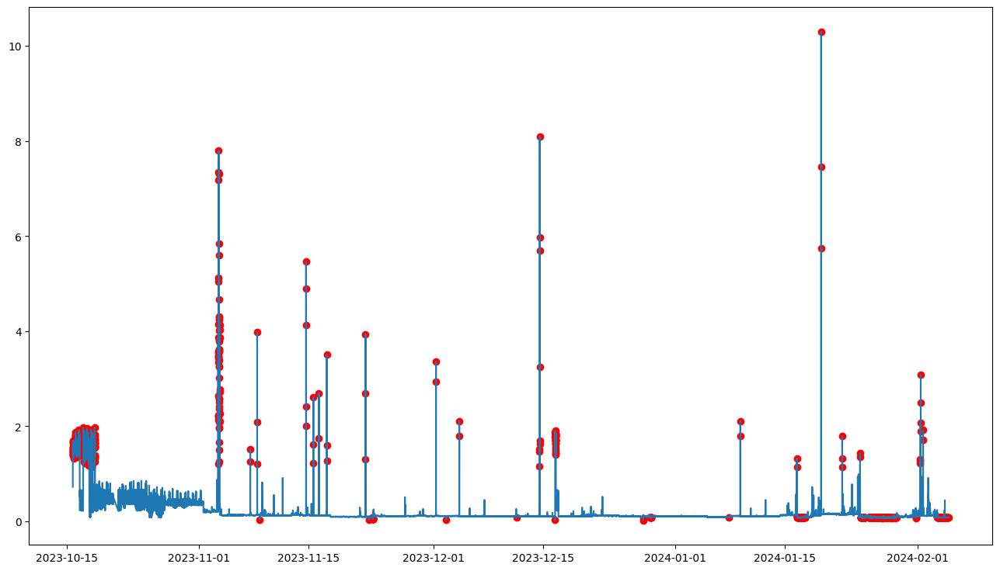

In [ ]:
fig, ax = plt.subplots(figsize=(16, 9))
a = dfx.loc[dfx.outlier == 1, [column_usage]]

ax.plot(dfx.index, dfx[column_usage])
ax.scatter(a.index, a[column_usage], color='red')
plt.show()

In [ ]:
y_pred = dfx['outlier']
colors = ['green' if a == 0 else 'red' for a in y_pred]

# Create a scatter plot of the data with anomalies highlighted in red
fig = go.Figure(data=go.Scatter(x=dfx.index, y=dfx[column_usage],
                                 mode='markers', marker=dict(color=colors, size=3)))

# Set the title and axis labels for the plot
fig.update_layout(title=dict(text='LOF Anomaly prediction', x=0.5),
                  yaxis_title='Value',
                  xaxis_title='Timestamp')

# Show the plot
fig.show()

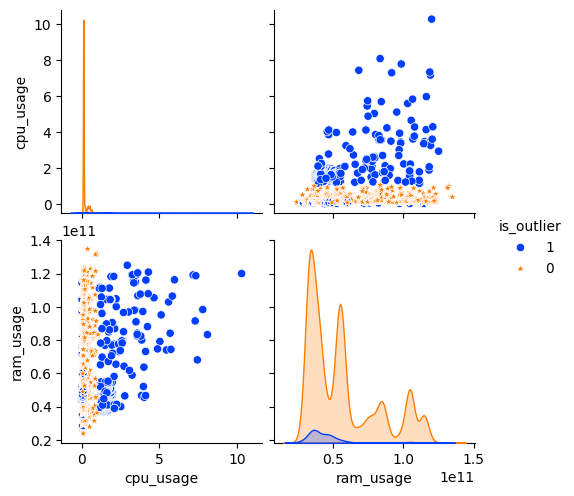

In [ ]:
sns.pairplot(data=dfx, vars = df.columns,
             hue='is_outlier', hue_order=[1, 0],
             markers=['*', 'o'],  palette='bright');

# Metrics


In [ ]:
y_pred = y_pred == 0
dfx['name'] = y_pred
y_pred

time
2023-10-15 19:10:00     True
2023-10-15 19:15:00    False
2023-10-15 19:20:00    False
2023-10-15 19:25:00    False
2023-10-15 19:30:00    False
                       ...  
2024-02-04 23:35:00     True
2024-02-04 23:40:00     True
2024-02-04 23:45:00     True
2024-02-04 23:50:00     True
2024-02-04 23:55:00     True
Name: outlier, Length: 31036, dtype: bool

In [ ]:
print(y_pred.value_counts())

True     29503
False     1533
Name: outlier, dtype: int64


In [ ]:
p_values = {}
p_stats_ = {}
percent = {}
silhoutte = {}
calinski_harabasz = {}
davies_bouldin = {}

# scaler = MinMaxScaler()
# X = scaler.fit_transform(X[column_usage])

cols_in = [column_usage]

In [ ]:
dfx['name'].value_counts()

True     29503
False     1533
Name: name, dtype: int64

In [ ]:
#percent anomaly
dist = dfx['name'].value_counts(normalize=True)
print(dist)
percent['name'] = dist.loc[True]

True     0.950606
False    0.049394
Name: name, dtype: float64


In [ ]:
#silhouette conficient samples non-anomaly
labels = [1 if i == True else 2 for i in dfx['name']]
dfx['silhouette_zcore_'] = silhouette_samples(df[[column_usage]], labels)
silhoutte['name'] = dfx[dfx['name']]['silhouette_zcore_'].mean()

In [ ]:
#ks coeficient
normal = dfx.loc[dfx['name'] == False, [column_usage]]
anomaly = dfx.loc[dfx['name'] == True, [column_usage]]
for col_in in tqdm(cols_in):
  if len(normal)>0 and len(anomaly)>0:
    stats_, pvalue = stats.kstest(normal[col_in], anomaly[col_in])
    p_values[col_in+'_'] = pvalue
    p_stats_[col_in+'_'] = stats_

100%|██████████| 1/1 [00:00<00:00, 138.00it/s]


In [ ]:
from sklearn.metrics import calinski_harabasz_score

ch_index = calinski_harabasz_score(df[[column_usage]], labels)
calinski_harabasz['name'] = round(ch_index, 3)
print("Calinski-Harabasz Index:", round(ch_index, 3))

Calinski-Harabasz Index: 9798.57


In [ ]:
from sklearn.metrics import davies_bouldin_score

dbi = davies_bouldin_score(df[[column_usage]], labels)
davies_bouldin['name'] = round(dbi, 3)
print("Davies-Bouldin Index:", round(dbi, 3))

Davies-Bouldin Index: 1.367


pvalue
  svm_algorithm  pvalue
0    cpu_usage_     0.0
{'cpu_usage_': 0.0}


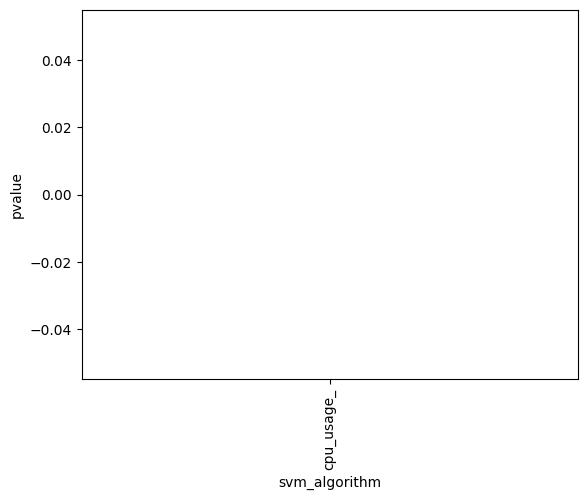

statistics
  svm_algorithm  statistics
0    cpu_usage_    0.549902
{'cpu_usage_': 0.5499021526418787}


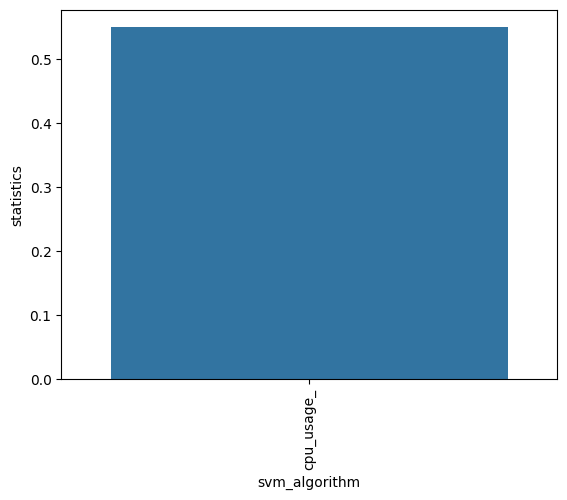

percent
  svm_algorithm   percent
0          name  0.950606
{'name': 0.9506057481634231}


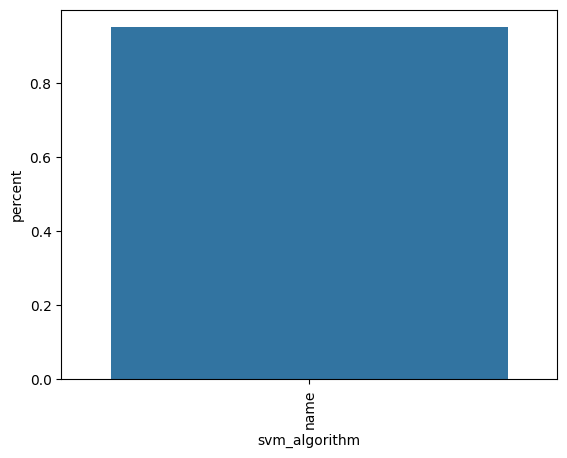

silhoutte
  svm_algorithm  silhoutte
0          name   0.869263
{'name': 0.8692627233270552}


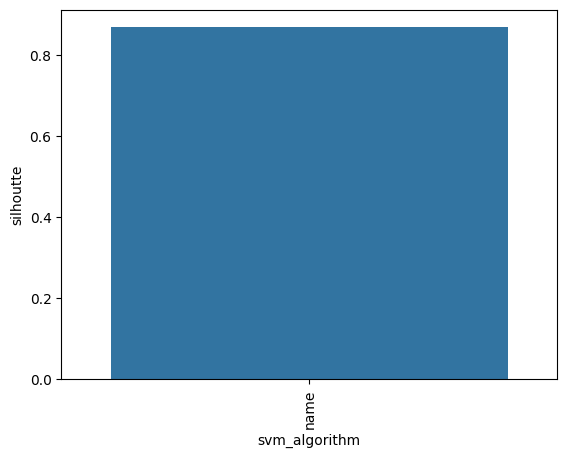

calinski_harabasz
  svm_algorithm  calinski_harabasz
0          name            9798.57
{'name': 9798.57}


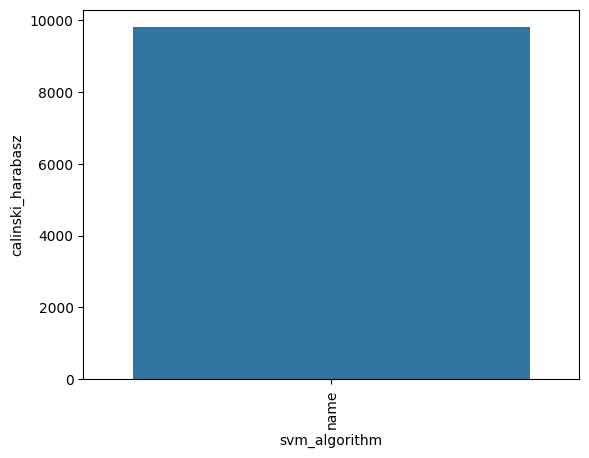

davies_bouldin
  svm_algorithm  davies_bouldin
0          name           1.367
{'name': 1.367}


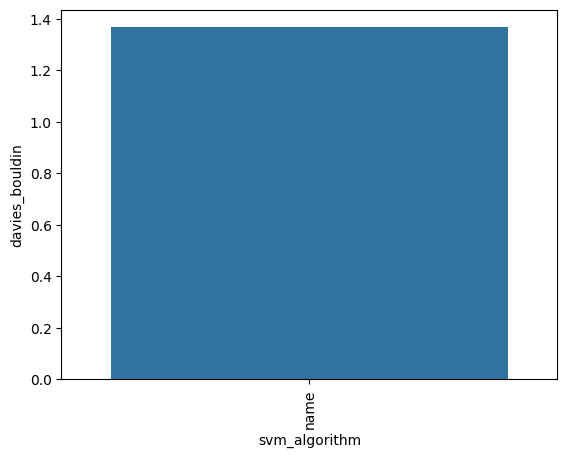

In [ ]:
for name, dictionary in {'pvalue': p_values, 'statistics': p_stats_, 'percent': percent, 'silhoutte':silhoutte, 'calinski_harabasz': calinski_harabasz, 'davies_bouldin': davies_bouldin}.items():
    print(name)
    df_values =  pd.DataFrame([dictionary])
    df_values = df_values.T
    df_values.reset_index(inplace=True)
    df_values.columns = ['svm_algorithm', name]
    print(df_values)
    print(dictionary)

    sns.barplot(data=df_values, x='svm_algorithm', y=name)
    plt.xticks(df_values.index, df_values['svm_algorithm'].values, rotation=90)
    plt.show()

In [ ]:
for name, dictionary in {'pvalue': p_values, 'statistics': p_stats_, 'percent': percent, 'silhoutte':silhoutte, 'calinski_harabasz': calinski_harabasz, 'davies_bouldin': davies_bouldin}.items():
    print(name + ': ' + str(np.array(list(dictionary.values())).mean()))

pvalue: 0.0
statistics: 0.5499021526418787
percent: 0.9506057481634231
silhoutte: 0.8692627233270552
calinski_harabasz: 9798.57
davies_bouldin: 1.367


# Save Model

In [ ]:
 model.save('/content/drive/MyDrive/Colab Notebooks/k8s/models/model_autoencoder_collected_' + column_usage + '.h5')
